# Mulit-class Dog breed Classification

This notebook builds an multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. The problem
Identifying the breed of a dog with an image

## 2. Data
Kaggle: https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation
Through Multi Class Log Loss between the predicted probability, and the observed target.

## 4. Features
Some information about the data:
* Images (Unstructured data)
* Use Deep Learning / Transfer Learning
* 120 different classes - not binary classification
* 10,000 images in training set - with labels
* 10,000 images in test set - without labels

In [1]:
# Unzip the data in Google Drive
# !unzip "drive/MyDrive/Colab Notebooks/dog-vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/dog-vision/"

## 5. Workspace preperation

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Use a GPU ✅

In [2]:
# Standard setup

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
# Import TensorFlow in Colab
import tensorflow as tf
import tensorflow_hub as hub
print ("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.9.2
TF Hub version: 0.12.0
GPU available


## 6. Getting our data ready (Turning into Tensors)

In [4]:
# Check labels
labels_csv = pd.read_csv("drive/MyDrive/Colab Notebooks/dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


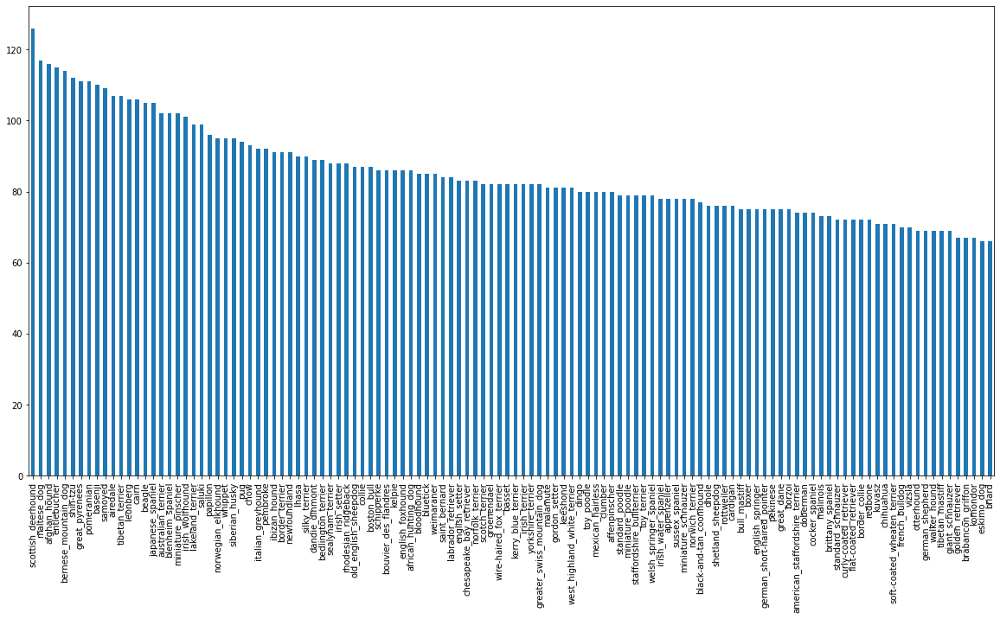

In [6]:
# Images of each breed
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10));

In [7]:
labels_csv["breed"].value_counts().median()

82.0

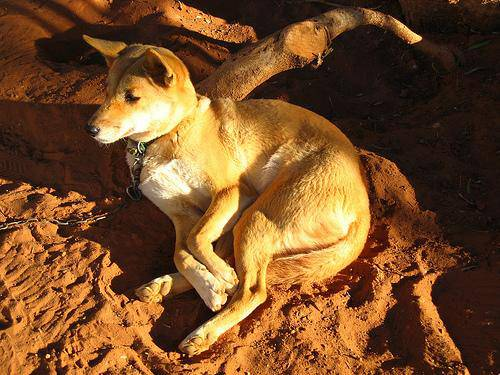

In [8]:
# an example image from training set
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

* List of image file pathnames

In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# Create pathnames from image id's
filenames = ["drive/MyDrive/Colab Notebooks/dog-vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check top 10
filenames[:10]

['drive/MyDrive/Colab Notebooks/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# Check if number of filenames matches actual image files
len(filenames)

10222

In [12]:
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/dog-vision/train/")) == len(filenames):
  print("Filenames match actual count of files")
else:
  print("Filenames do not match count of files! Check target directory")

Filenames match actual count of files


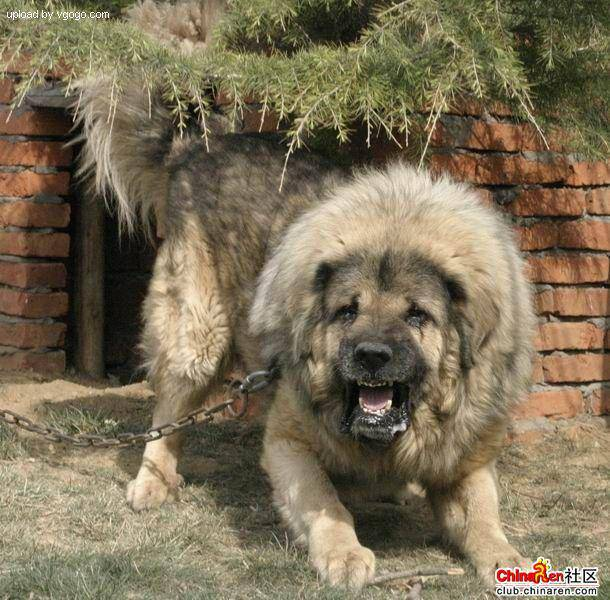

In [13]:
Image(filenames[9000])

In [14]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [15]:
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [16]:
len(labels)

10222

In [17]:
# we are checking the numbers of labels to number of images to see if any is missing.
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Numbers do not match. Check data directories")

Number of labels matches number of filenames


In [18]:
# Find unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [19]:
len(unique_breeds)

120

In [20]:
# turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [21]:
# Turn every level into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
len(boolean_labels)

10222

In [23]:
# Example: turning boolean to integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## 7. Creating Train and Validation set

In [24]:
# Setup X and Y variables
X = filenames
y = boolean_labels

Working on a sample of 1000 images - to save time

In [25]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min: 1000, max:10000, step: 1000}

In [26]:
# Splitting data
from sklearn.model_selection import train_test_split

# Split into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [27]:
X_train[:5], y_train[:2]

(['drive/MyDrive/Colab Notebooks/dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Colab Notebooks/dog-vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Colab Notebooks/dog-vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Colab Notebooks/dog-vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False,

In [28]:
X_val[:2], y_val[:2]

(['drive/MyDrive/Colab Notebooks/dog-vision/train/0ca9280205bd68d201e1d708db3f209d.jpg',
  'drive/MyDrive/Colab Notebooks/dog-vision/train/12405b2e93417d81f5308769c4e184c7.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,

### Preprocessing images (turning images into Tensors)
A custom function will do:

* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable: 'image'
* Turn 'image' (a jpg) to Tensors
* Normalize image - convert color channel 0-255, to 0-1 values
* Resize the 'image' to be a shape (224, 224)
* Return the modified 'image'

In [29]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [30]:
# image data range 0-255
image.max(), image.min()

(255, 0)

In [31]:
# checking array of image
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [32]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

The only difference between the np array and the tf array is that the tf array will use GPU

In [33]:
# An example of converting image to tensors with different functions
# Reading an image file
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [34]:
# Turning read jpg image into numerical channels with 3 colours
tensor = tf.image.decode_jpeg(tensor, channels = 3)
tensor

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [35]:
# convert color channel values from 0-255 to 0-1
tensor = tf.image.convert_image_dtype(tensor, tf.float32)
tensor

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

In [36]:
# Making an image preprocessing function

# Define image size
IMG_SIZE = 224 #@param {type:'slider', min: 16, max: 256, step: 1}

def process_image(image_path):
  """
  Takes an image path and turns the image into a Tensor
  """
  # read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels = 3)
  # convert color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning our data into batches - DL error reduces if used in mini-batches of 32 or less

Why mini-batches?

* Memory might not be enough to do all data in one go

TensorFlow effective use needs Tensor Tuples like ('image', 'label')

In [37]:
# Create a function to return tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and label, processes the image and returns a tuple
  """
  image = process_image(image_path)
  return image, label

In [38]:
# Demo of the above function
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now, turning all of X, and y into batches of 32

In [39]:
# Define batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it is training data.
  Does not shuffle the data if it is validation data.
  Also accepts test data as input (no labels)
  """
  # Test data - no labels available
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # Valid data set - no need to shuffle
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  # Training data set
  else:
    print("Creating training data batches...")
    # Turn file paths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor - this is faster
    data = data.shuffle(buffer_size = len(X))
    # Create (image, label) tuples and also turns image path into preprocessed image
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [40]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [41]:
# Check data batches attribute
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

In [42]:
# Function to view images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """

  # Setup figure
  plt.figure(figsize=(10, 10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [43]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [44]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

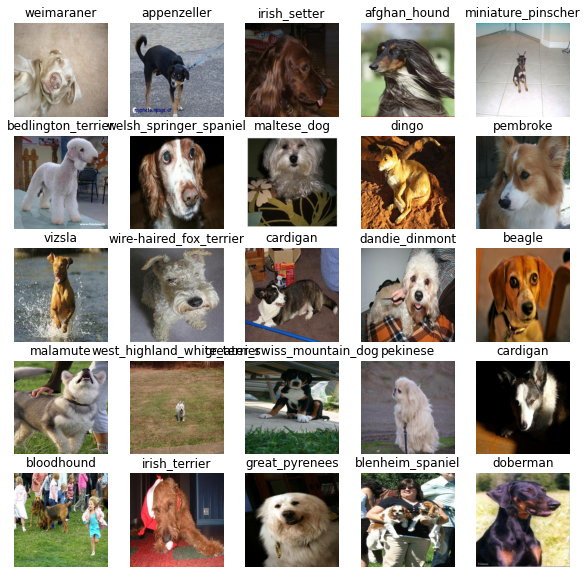

In [45]:
# Visualizing the training batches data - the images shuffle
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

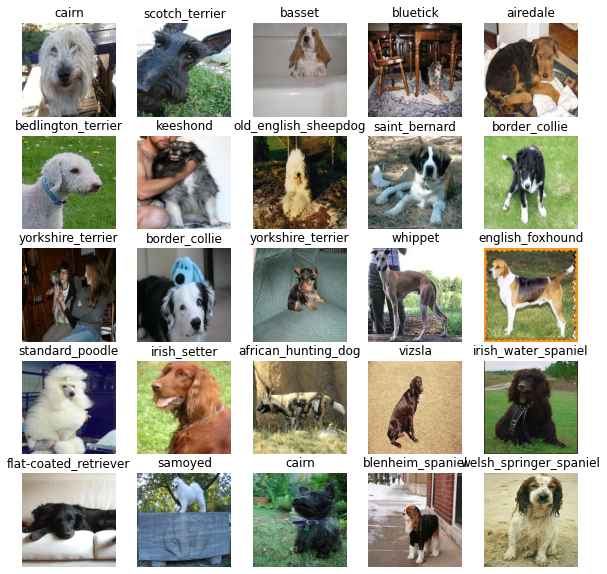

In [46]:
# Visualizing the valid batches data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## 8. Building a model

There are many ways to make DL. We will use:

* Transfer Learning

Define:
* Input shape (images shape, in form of Tensors) to model
* The output shape (image labels, in form of Tensors) of model
* The URL of the model to use

In [47]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5" # from TensorFlow Hub

Using Keras DL model to use the setup above.

Custom function:
* Takes input shape, output shape, and chosen model as parameters
* Defines layers in Keras model in sequential order -input -model -output
* Compiles the model (also says how it should be evaluated and improved)
* Builds the model (tells the input it would receive)
* Returns the model

In [48]:
# Create a function to build a Keras model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 input
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2 output. For Binary it would be "Sigmoid"
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(), # For binary it would be 'BinaryCrossentropy'
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [49]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## 9. Creating callbacks
Callbacks are helper functions that a model can use that can -

* Save model's progress
* Check model's progress
* Stop training early if there are not improvements

Creating two callbacks:

1. for TensorBoard - helps track model's progress

* Load the TensorBoard notebook extension ✅
* Create a TensorBoard callback to save logs and pass it to model's 'fit' function ✅
* Visualize model's training logs with '%tensorboard' magic function after model training

2. for early stopping - to stop the model if it is not improving and stop overfitting

### TensorBoard callback

In [50]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [51]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory
  logdir = os.path.join("drive/MyDrive/Colab Notebooks/dog-vision/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # logs will be tracked everytime we run an experiment
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping callback

In [52]:
# Create eraly stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## 10. Training a model (on a subset of data)

First model only on 10k images, to ensure model is working correctly

In [53]:
# an epoch is how many passes our model will go through our data
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [54]:
# check to make sure we are running on a GPU
print("GPU", "available!") if tf.config.list_physical_devices("GPU") else "Not available"

GPU available!


Model to train a model:

* Create a model using 'create_model()'
* Setup TensorBoard callback using 'create_tensorboard_callback()'
* Call the 'fit()' function on model and pass training data, validation data, number of epochs to train for, and the callbacks
* Return the model

In [55]:
# Function to train and return model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime a new model in trained
  tensorboard = create_tensorboard_callback()

  # Fit the model to data passing it the callbacks
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks=[tensorboard, early_stopping])
  # return the fitted model
  return model

In [56]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 122s 4s/step - loss: 4.6284 - accuracy: 0.0988 - val_loss: 3.5063 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 4s 149ms/step - loss: 1.6877 - accuracy: 0.6675 - val_loss: 2.2210 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 4s 142ms/step - loss: 0.5761 - accuracy: 0.9513 - val_loss: 1.7486 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 4s 145ms/step - loss: 0.2559 - accuracy: 0.9875 - val_loss: 1.5357 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 166ms/step - loss: 0.1495 - accuracy: 0.9975 - val_loss: 1.4580 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 4s 168ms/step - loss: 0.1028 - accuracy: 0.9987 - val_loss: 1.4155 - val_accuracy: 0.6300
Epoch 7/100
25/25 [==============================]

Model has stopped as val_accuracy has stopped at 0.6550

Epoch 15/100
25/25 [==============================] - 4s 162ms/step - loss: 0.0220 - accuracy: 1.0000 - val_loss: 1.2488 - val_accuracy: 0.6550

Model is overfitting as it is performing far better in Training (1) than validation data (0.6550)

After two more iterations it became better:

Epoch 12/100
25/25 [==============================] - 4s 142ms/step - loss: 0.0311 - accuracy: 1.0000 - val_loss: 1.2706 - val_accuracy: 0.6950

Then another two and it became worse:

Epoch 13/100
25/25 [==============================] - 4s 147ms/step - loss: 0.0277 - accuracy: 1.0000 - val_loss: 1.2951 - val_accuracy: 0.6500

### Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will access logs and visualize contents

In [57]:
%tensorboard --logdir drive/My\ Drive/Colab\ Notebooks/dog-vision/logs


Output hidden; open in https://colab.research.google.com to view.

## 11. Making and evaluating predictions using a trained model

In [58]:
# Make predictions on a validation data (not used to train on)
# predict is the same as predict_proba in scikit learn
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 3s 105ms/step


array([[1.9763416e-04, 1.7209097e-05, 8.4247626e-04, ..., 2.7783558e-04,
        1.5842519e-05, 5.7729851e-03],
       [2.0347654e-03, 2.8616018e-05, 9.8928181e-04, ..., 2.5598315e-04,
        6.2522240e-04, 6.9659087e-05],
       [7.4457394e-06, 1.9794405e-05, 1.0300688e-05, ..., 3.7129557e-05,
        9.0484842e-05, 4.1038831e-04],
       ...,
       [1.1533084e-06, 1.6049886e-05, 1.4901160e-05, ..., 4.2959833e-05,
        2.0437656e-05, 1.5157675e-05],
       [6.8433033e-03, 1.5845483e-04, 1.5128909e-04, ..., 5.1418203e-04,
        9.6907046e-05, 2.1075016e-02],
       [6.8730005e-04, 3.7953487e-05, 1.3570413e-03, ..., 1.0812229e-02,
        1.0271864e-03, 1.2396468e-04]], dtype=float32)

In [59]:
predictions.shape

(200, 120)

In [60]:
len(y_val), len(unique_breeds)

(200, 120)

In [61]:
predictions[0] # for the 1st item the probabilities of being one of the 120 breeds

array([1.97634159e-04, 1.72090968e-05, 8.42476264e-04, 8.37348634e-05,
       1.72707005e-04, 7.61141710e-05, 1.28924185e-02, 2.63001281e-03,
       6.71747475e-05, 1.91092520e-04, 1.40955206e-04, 5.45672374e-05,
       5.14966086e-05, 6.21755680e-05, 2.92018725e-04, 2.19589943e-04,
       9.83318023e-05, 5.51924855e-02, 1.78182891e-05, 2.98708219e-05,
       2.12007458e-03, 1.81110401e-04, 1.99886581e-05, 1.74729014e-03,
       5.11595426e-05, 4.84729942e-04, 2.69560009e-01, 5.03965639e-05,
       1.08313689e-03, 1.06023734e-04, 1.75225607e-04, 1.63488369e-03,
       6.52388670e-04, 8.04716037e-05, 2.57986947e-04, 2.94634104e-02,
       4.68075996e-05, 1.36593240e-04, 1.71018837e-05, 1.21540477e-04,
       1.70524651e-03, 1.27839712e-05, 7.17794246e-05, 1.87625716e-04,
       3.12616467e-04, 1.88474063e-04, 1.24765284e-04, 2.12566127e-04,
       8.86144990e-04, 1.37985495e-04, 9.43599152e-05, 1.15419225e-05,
       6.60801888e-04, 5.18524394e-06, 1.36659321e-04, 4.54803303e-05,
      

In [62]:
len(predictions[0])

120

In [63]:
np.sum(predictions[0]), np.sum(predictions[1]) # due to softmax, all sum may not be 1.0. Softmax is making this withing 120 classes

(1.0, 0.9999997)

In [64]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.97634159e-04 1.72090968e-05 8.42476264e-04 8.37348634e-05
 1.72707005e-04 7.61141710e-05 1.28924185e-02 2.63001281e-03
 6.71747475e-05 1.91092520e-04 1.40955206e-04 5.45672374e-05
 5.14966086e-05 6.21755680e-05 2.92018725e-04 2.19589943e-04
 9.83318023e-05 5.51924855e-02 1.78182891e-05 2.98708219e-05
 2.12007458e-03 1.81110401e-04 1.99886581e-05 1.74729014e-03
 5.11595426e-05 4.84729942e-04 2.69560009e-01 5.03965639e-05
 1.08313689e-03 1.06023734e-04 1.75225607e-04 1.63488369e-03
 6.52388670e-04 8.04716037e-05 2.57986947e-04 2.94634104e-02
 4.68075996e-05 1.36593240e-04 1.71018837e-05 1.21540477e-04
 1.70524651e-03 1.27839712e-05 7.17794246e-05 1.87625716e-04
 3.12616467e-04 1.88474063e-04 1.24765284e-04 2.12566127e-04
 8.86144990e-04 1.37985495e-04 9.43599152e-05 1.15419225e-05
 6.60801888e-04 5.18524394e-06 1.36659321e-04 4.54803303e-05
 8.95478843e-06 2.20424891e-03 5.69515978e-04 6.56393245e-02
 2.30886915e-04 2.05607270e-04 2.59722788e-02 1.44254100e-05
 2.36230640e-04 3.787761

In [65]:
# Turn predictions into labels
def get_pred_label(prediction_probabilities):
  """
  Turns predicted arrays into labels
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of predicted probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

Since validation data is in a batch data set, we have to compile them out of the batch to make predictions and compare with validation labels (truth)

In [66]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [67]:
# Creating a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batch data set (images, labels) Tensor and returns seperate arrays of images and labels.
  """
  images = []
  labels = []

  #loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unatchify the validation data
val_images, val_labels = unbatchify(val_data)
# Check one out
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [68]:
get_pred_label(val_labels[0])

'affenpinscher'

In [69]:
get_pred_label(predictions[0])

'cairn'

So the first one predicted is wrong

### 12. Functions to visualize results:

We have
* Prediction labels
* Validation labels (truth labels)
* Validation images

Visualization will use:
* Array of prediction probabilities, array of truth labels, array of images and an integer
* Convert prediction probabilities to predicted label
* Plot predicted label, and predicted proability, the truth label, and the image on a single plot

In [70]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth, and image for n
  """
  prediction_probabilities, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(prediction_probabilities)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted label, probability of predictions, and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(prediction_probabilities)*100,
                                    true_label),
                                    color = color)

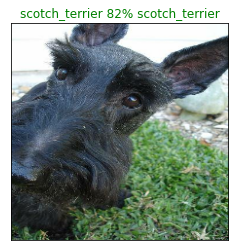

In [71]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n = 1)

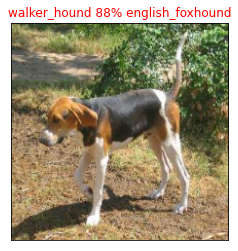

In [72]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n = 42)

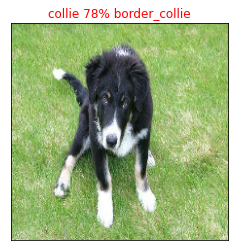

In [73]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n = 9)

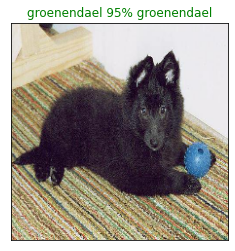

In [74]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n = 77)

### Visualize top ten breed predictions for each prediction (Top 10 accuracy)

Function will need:
* Input of prediction probabilities array, a ground truth array, and an integer
* Find the prediction using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction progabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [75]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with truth label for sample n
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexed = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexed]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexed]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

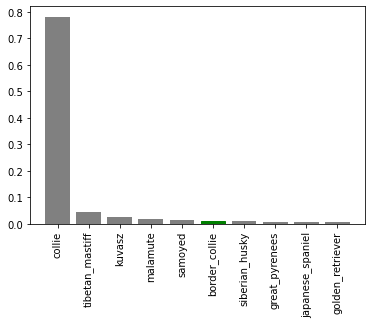

In [76]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

### Combining the two visuals together

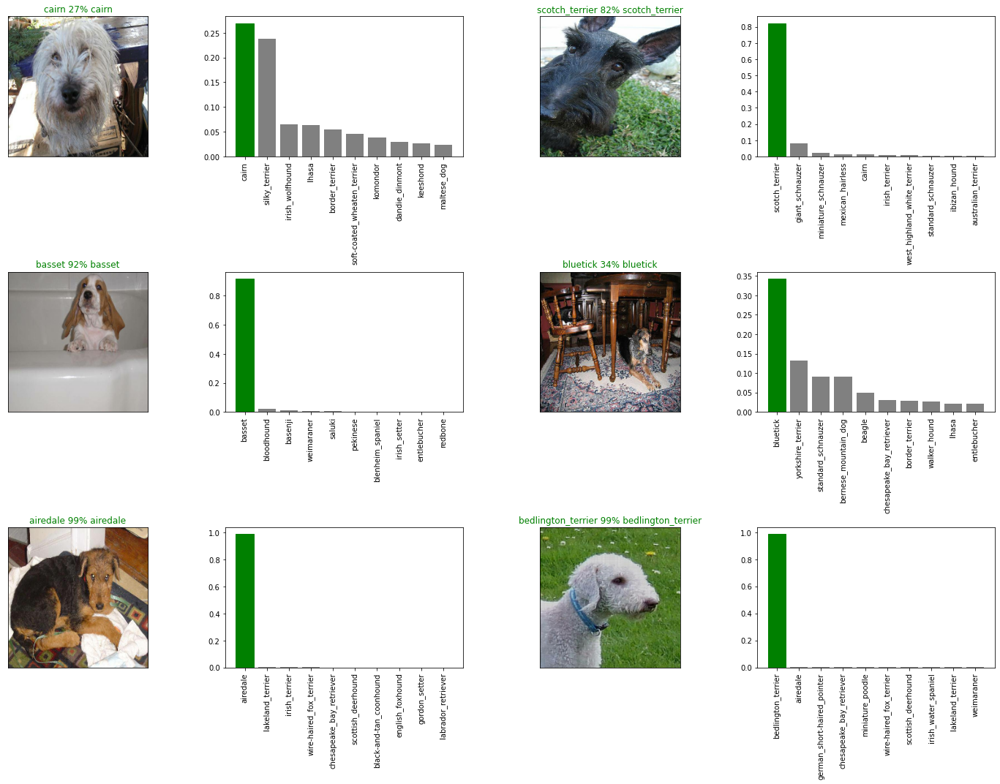

In [77]:
# Few predictions and their different views
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

## 12. Saving and reloading a trained model

In [78]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """

  # Create a model directory path name with current time
  modeldir = os.path.join("drive/MyDrive/Colab Notebooks/dog-vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + ".h5" #.h5 is the format to save models in
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [79]:
# Create a function to load a saved model
def load_model(model_path):
  """
  Loads a saved model from specified path
  """
  print(f"Loading save model from {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [80]:
# Saving model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/dog-vision/models/20221230-14181672409935-.h5...


'drive/MyDrive/Colab Notebooks/dog-vision/models/20221230-14181672409935-.h5'

In [94]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Colab Notebooks/dog-vision/models/20221230-14181672409935-.h5")

Loading save model from drive/MyDrive/Colab Notebooks/dog-vision/models/20221230-14181672409935-.h5


In [95]:
# Evaluiate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 91ms/step - loss: 1.2951 - accuracy: 0.6500


[1.2950950860977173, 0.6499999761581421]

In [96]:
# Evaluated the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 97ms/step - loss: 1.2951 - accuracy: 0.6500


[1.2950950860977173, 0.6499999761581421]

## 13. Training on Full data set

In [97]:
len(X), len(y)

(10222, 10222)

In [98]:
X[:10]

['drive/MyDrive/Colab Notebooks/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [99]:
len(X_train)

800

In [100]:
y[:10]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [101]:
len(y_train)

800

In [102]:
# create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [103]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [104]:
# Create a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [105]:
# Create full data model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training all data, so not possible to monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

#### The full model will take time as it is 10k data. The first epoch will take a long tim, as the GPU will load all images in memory.

In [106]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 38s 107ms/step - loss: 1.3346 - accuracy: 0.6666
Epoch 2/100
320/320 [==============================] - 34s 107ms/step - loss: 0.4003 - accuracy: 0.8798
Epoch 3/100
320/320 [==============================] - 34s 106ms/step - loss: 0.2358 - accuracy: 0.9358
Epoch 4/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1521 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 34s 105ms/step - loss: 0.1049 - accuracy: 0.9798
Epoch 6/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0768 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0593 - accuracy: 0.9906
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0470 - accuracy: 0.9939
Epoch 9/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0380 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 34s 107m

In [107]:
save_model(model, suffix="fulldata-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/dog-vision/models/20221230-14551672412118-.h5...


'drive/MyDrive/Colab Notebooks/dog-vision/models/20221230-14551672412118-.h5'

In [108]:
loaded_full_model = load_model("drive/MyDrive/Colab Notebooks/dog-vision/models/20221230-14551672412118-.h5")

Loading save model from drive/MyDrive/Colab Notebooks/dog-vision/models/20221230-14551672412118-.h5


## 14. Making prediction on Test data set

Model is trained on images in the form of Tensor batches, the test data has to be also made in the same format

Old functions to use:
* 'create_data_batches()'

We need to:
* Get test image filenames ✅
* Convert the filenames into batches using 'create_data_batches()' with parameter 'True' ✅
* Make a predictions array on test batches with predict() method on model ✅

In [120]:
# Loading test data
test_path = "drive/MyDrive/Colab Notebooks/dog-vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab Notebooks/dog-vision/test/e2686707ac5b5f75ce2ccbc906b624d8.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e69416b277bf04ba83a5f3586fe12f9b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e5560686ee44dc59dbb99d6ef4ea54d8.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e379ba26a5e2e22e85975b839e0e401b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e2d65ef41ec9a649c8dbd92f0b821163.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/df2ce797bf398414aac7e20119c17cb6.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/dfe25675d32a75ade0f2893cf2ab63a9.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/dd2228d2fbb3ddc8fb350106c2d989ef.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e55534e27f92b4c8177ed2beb1cbba7b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/test/e1e7949f64ff3283a5dafa9d39199193.jpg']

In [121]:
len(test_filenames)

10357

In [122]:
# Create test data batches
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [123]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Calling predict on full model and passing test data batch will take a long time

In [124]:
# Make predictions on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                     verbose = 1)

324/324 [==============================] - 193s 586ms/step


In [128]:
# Save predictions (NumPy array) to csv file - to access later on
np.savetxt("drive/MyDrive/Colab Notebooks/dog-vision/preds_array.csv", test_predictions, delimiter = ",")

In [129]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Colab Notebooks/dog-vision/preds_array.csv", delimiter = ",")

In [130]:
test_predictions[:10]

array([[1.08505468e-04, 5.78286699e-06, 2.16037315e-05, ...,
        3.56644159e-05, 3.30390976e-05, 1.70903709e-02],
       [2.81072629e-04, 1.67820035e-04, 6.16126126e-05, ...,
        5.91231292e-05, 7.09998640e-05, 1.54331943e-03],
       [2.14842832e-04, 4.94318556e-05, 4.16052004e-04, ...,
        1.35376467e-04, 4.97686051e-05, 8.30733031e-03],
       ...,
       [1.92624773e-03, 4.50633452e-05, 5.22359507e-04, ...,
        1.46484119e-03, 8.82687571e-04, 4.98975739e-02],
       [1.57504852e-04, 1.42398043e-04, 1.86014440e-05, ...,
        2.02545401e-04, 7.02320877e-03, 2.39718756e-05],
       [1.07161773e-04, 5.77179926e-05, 8.56121624e-05, ...,
        1.08151644e-05, 5.16354485e-05, 1.11025083e-03]])

In [131]:
test_predictions.shape

(10357, 120)

## 15. Preparing for submission

* Create a pandas DataFrame with ID and Dog Breeds
* Add data to ID by extracting test image ID's from filepaths
* Add data (prediction probabilities) to each of the dog breed columns
* Export DataFrame as a CSV to submit

In [134]:
# Create a pandas DataFrame with empty column
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.T

""
id
affenpinscher
afghan_hound
african_hunting_dog
airedale
...
welsh_springer_spaniel
west_highland_white_terrier
whippet
wire-haired_fox_terrier


In [140]:
# Append test image id's to prediction data column
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)] # the [0] is to get the first bit, and leave out the .jpeg part
test_ids[:5]
preds_df["id"] = test_ids

In [142]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2686707ac5b5f75ce2ccbc906b624d8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e69416b277bf04ba83a5f3586fe12f9b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5560686ee44dc59dbb99d6ef4ea54d8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e379ba26a5e2e22e85975b839e0e401b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2d65ef41ec9a649c8dbd92f0b821163,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [143]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2686707ac5b5f75ce2ccbc906b624d8,0.000109,0.000006,0.000022,0.000138,0.001702,0.000036,0.001032,0.001528,0.000019,...,0.020841,0.001092,0.000001,0.000176,0.000029,0.000105,0.010743,0.000036,0.000033,0.017090
1,e69416b277bf04ba83a5f3586fe12f9b,0.000281,0.000168,0.000062,0.000003,0.000018,0.000134,0.000107,0.001023,0.000045,...,0.000098,0.000059,0.000082,0.000029,0.000003,0.000017,0.000257,0.000059,0.000071,0.001543
2,e5560686ee44dc59dbb99d6ef4ea54d8,0.000215,0.000049,0.000416,0.000052,0.007617,0.011168,0.035736,0.186508,0.003200,...,0.005507,0.004858,0.000307,0.000140,0.000533,0.000948,0.013530,0.000135,0.000050,0.008307
3,e379ba26a5e2e22e85975b839e0e401b,0.000106,0.000009,0.001073,0.000321,0.000089,0.000129,0.002743,0.012595,0.000045,...,0.000893,0.809914,0.000114,0.006627,0.000036,0.000089,0.001071,0.000057,0.000028,0.000105
4,e2d65ef41ec9a649c8dbd92f0b821163,0.000026,0.000234,0.000074,0.001885,0.000214,0.000007,0.000492,0.000095,0.000029,...,0.050059,0.000139,0.000012,0.000254,0.000732,0.000008,0.002495,0.000118,0.000340,0.000040


In [145]:
preds_df.to_csv("drive/MyDrive/Colab Notebooks/dog-vision/full_model_prediction_submission_mobilenetV2.csv",
               index = False)

## 16. Predictions on custom images

* Get file paths of images
* Turn file paths to data batches with 'create_data_batches()' with parameter 'test_data = True'
* Pass the image batch to 'predict()' method
* Convert the prediction output probabilities to prediction labels
* Compare the predicted labels to custom images

In [156]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Colab Notebooks/dog-vision/custom_photo/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [157]:
custom_image_paths

['drive/MyDrive/Colab Notebooks/dog-vision/custom_photo/ash-v0_MCllHY9M-unsplash.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/custom_photo/karsten-winegeart-BJaqPaH6AGQ-unsplash.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/custom_photo/roberto-nickson--s5WfAx74fM-unsplash.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/custom_photo/richard-brutyo-Sg3XwuEpybU-unsplash.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/custom_photo/alvan-nee-8g0D8ZfFXyA-unsplash.jpg',
 'drive/MyDrive/Colab Notebooks/dog-vision/custom_photo/alvan-nee-eoqnr8ikwFE-unsplash.jpg']

In [158]:
# Turn custom images into batch data set
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [159]:
# Make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [160]:
custom_preds.shape

(6, 120)

In [161]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['siberian_husky',
 'french_bulldog',
 'irish_setter',
 'golden_retriever',
 'miniature_schnauzer',
 'chihuahua']

In [162]:
# Get custom images - 'unbatchify' will not work as there is no labels
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

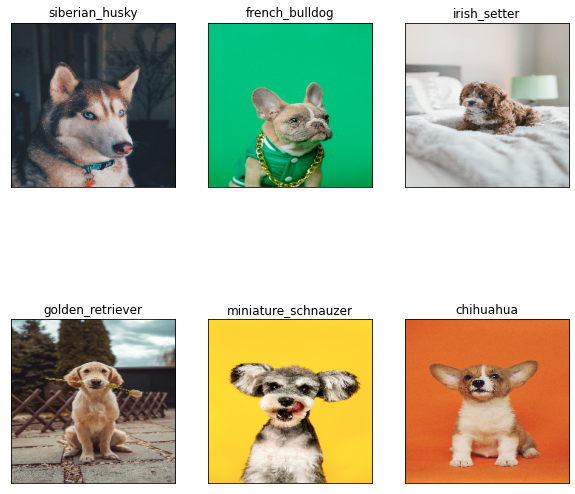

In [169]:
# Check custom image predictions. We can plt.subplot based on images we wanted to see
plt.figure(figsize = (10,10))
for i, image in enumerate(custom_images):
  plt.subplot(2, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)